In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

# running and loading 


using lock files : https://github.com/bicv/SparseHebbianLearning/blob/master/shl_scripts/shl_experiments.py#L254




In [2]:
# stimulus = 2D + time (see Flash-lag effect paper, insert link)
do_run = False
if do_run:
    #%reset
    wEE = 0.08 # wEE weights in EXC to itself = {0.01, 0.02, etc}
    wIE = 0.08 # wIE weights in INH to EXC = {0.01, 0.02, etc}
    E_root = 1 # dEE is distance-based prob connection exp(-d**(1/E_root) in EXC to itself and to INH
    I_root = 2 # dIE is distance-based prob connection exp(-d**(1/I_root) in INH to itself and to EXC 
    # insert distance based par delay
    #!rm outputs/*
    im_noise = 0.01
    im_contrast = 0.1
    N_tau = 30
    !ipython 2020-09-10_probabilistic_2D_bump_attractor.py $wEE $wIE $E_root $I_root $im_noise $im_contrast $N_tau


/home/alberto-int/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'pynestkernel' does not match runtime version 3.7
  return f(*args, **kwds)
[INFO] [2020.9.17 14:32:32 /build/nest-nIOgnb/nest-2.20.0/nestkernel/rng_manager.cpp:217 @ Network::create_rngs_] : Creating default RNGs
[INFO] [2020.9.17 14:32:32 /build/nest-nIOgnb/nest-2.20.0/nestkernel/rng_manager.cpp:260 @ Network::create_grng_] : Creating new default global RNG

              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: nest-2.20.0
 Built: Feb  3 2020 05:20:48

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.

]0;IPython: Downloads/2020-09-17_uploadCSAConnector: libneurosim support not available in NEST.
Falling back on PyNN's default CSAConnector.
Please re-compile NEST using --with-li

### Loading libraries and getting pkl files

In [3]:
###---LOADING PYTHON LIBs
import pickle
import math as m
import numpy as np
import seaborn as sns
import pandas as pd
import scipy as sp
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score as db
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
from IPython.display import Video, HTML

In [4]:
###---LOAD DATA AND TEST THE CORRECTNESS 
spikes_outE = pickle.load(open('outputs/input_2D/prob/popEdata.pkl', 'rb'))
spikes_outI = pickle.load(open('outputs/input_2D/prob/popIdata.pkl', 'rb'))
spikeSources = pickle.load(open('outputs/input_2D/prob/spikeSource.pkl','rb'))

for i in range(3):
    print('e', spikes_outE.segments[0].analogsignals[i].name)   
    print('i', spikes_outI.segments[0].analogsignals[i].name)          

e v
i v
e gsyn_exc
i gsyn_exc
e gsyn_inh
i gsyn_inh


In [5]:
###---PKLs FILE PROCESSING
for i in range(3):
    if spikes_outE.segments[0].analogsignals[i].name == 'v':
        E_v = spikes_outE.segments[0].analogsignals[i]
    if spikes_outE.segments[0].analogsignals[i].name == 'gsyn_exc':
        E_gsynE = spikes_outE.segments[0].analogsignals[i]
    if spikes_outE.segments[0].analogsignals[i].name == 'gsyn_inh':
        E_gsynI = spikes_outE.segments[0].analogsignals[i]
    #print(A_dataE.analogsignals[i].name)

for i in range(3):
    if spikes_outI.segments[0].analogsignals[i].name == 'v':
        I_v = spikes_outI.segments[0].analogsignals[i]
    if spikes_outI.segments[0].analogsignals[i].name == 'gsyn_exc':
        I_gsynE = spikes_outI.segments[0].analogsignals[i]
    if spikes_outI.segments[0].analogsignals[i].name == 'gsyn_inh':
       I_gsynI = spikes_outI.segments[0].analogsignals[i]
    #print(A_dataI.analogsignals[i].name)

# Spike sources
S_spikes = spikeSources.segments[0].spiketrains
E_spikes = spikes_outE.segments[0].spiketrains
I_spikes = spikes_outI.segments[0].spiketrains

# Transposed data
E_v=np.transpose(E_v)
E_gsynE = np.transpose(E_gsynE)
E_gsynI = np.transpose(E_gsynI)
I_v=np.transpose(I_v)
I_gsynE = np.transpose(I_gsynE)
I_gsynI = np.transpose(I_gsynI)

# defining function

In [22]:
def multisave_plot_surface(d, step, path, layer):
    
    if str(d.name)  == 'v':
        units = 'mV'
    else:
        units = 'uS'
        
    d_name =  str(d.name)   
    title = layer + ' | ' + d_name + ' [' + units + ']'
    
    d = d.as_array().reshape(int(np.sqrt(len(d))),int(np.sqrt(len(d))),int(len(d[0])))
    
    for i in np.arange(10, len(d[0][0]), step):
        X = np.arange(0, len(d), 1)
        X, Y = np.meshgrid(X, X)
        Z = d[:,:,i]
        #
        plt.clf()
        fig = plt.figure(1, figsize = (5,5))
        ax = fig.gca(projection='3d')
              
        im = ax.plot_surface(X, Y, Z, 
                    rstride = 1,
                    cstride = 1,
                    alpha = 0.85,
                    cmap = 'coolwarm',
                    linewidth = 0, 
                    antialiased = True,
                    edgecolor = 'none')
        
        #cset = ax.contourf(X, Y, Z, zdir='z', offset = min(d[0].ravel())-20, cmap = 'coolwarm')
        #cset = ax.contourf(X, Y, Z, zdir='y', offset = max(X.ravel())+10, cmap = 'coolwarm')
        #cset = ax.contourf(X, Y, Z, zdir='x', offset = min(X.ravel())-10, cmap = 'coolwarm')
        #cset = ax.contourf(X, Y, Z, zdir='z', offset = -300, cmap = 'coolwarm')
                
        cb = fig.colorbar(im, fraction = 0.01, pad = 0.1)
        #.set_clim(-75,0)
        cb.set_label('', rotation=0)
               #
        ax.set_title(title + ' | ' + str(i) + ' [ms]')
        ax.set_xlabel('neurons')
        ax.set_xlim(min(X.ravel())-10, max(X.ravel())+10)
        ax.set_ylabel('neurons')
        ax.set_ylim(min(X.ravel())-10, max(X.ravel())+10)
        ax.set_zlabel('')
        ax.set_zlim(min(d[0].ravel()), max(d[0].ravel()))
        
        fig.tight_layout()
        
        plt.savefig(path + layer + '/' + d_name + "_{0:04}.png".format(i), dpi=150)
        plt.close(fig) 
        
    import subprocess
    import os
    i = path + layer + '/' + d_name + '*.png'
    o = path + layer + '/' + d_name + '.gif' 
    subprocess.call('convert -delay 100 -loop 0 ' + i + ' ' + o, shell = True)
    subprocess.call('rm ' + path + layer + '/' + d_name + '*.png', shell = True)
    #os.system('start' + o)


    #return

In [ ]:

def make_gif(gifname, fnames, fps):
    import imageio

    with imageio.get_writer(gifname, mode='I', fps=fps) as writer:
        for fname in fnames:
            writer.append_data(imageio.imread(fname))

    from pygifsicle import optimize
    optimize(str(gifname))
    return gifname

import moviepy.editor as mpy

import moviepy.video.io.ImageSequenceClip
def make_mp4(moviename, fnames, fps):
    clip = moviepy.video.io.ImageSequenceClip.ImageSequenceClip(fnames, fps=fps)
    clip.write_videofile(moviename)
    return moviename



#    def show(self, filename, width=width):
#        return mpy.ipython_display(filename, fps=self.opt.fps, width=width, autoplay=True, loop=True)

# making png and gif

In [23]:
data = [E_v, 
        E_gsynE,
        E_gsynI, 
        I_v,
        I_gsynE,
        I_gsynI]

path = "moving_bump_png/"

step = 50
for i in range(len(data)):
    print(i)
    if i <= 2: 
        layer = 'E_layer'
    else: 
        layer = 'I_layer'
    
    multisave_plot_surface(data[i], step, path, layer)




0
1
2
3
4
5


# E layer moving dot video representations

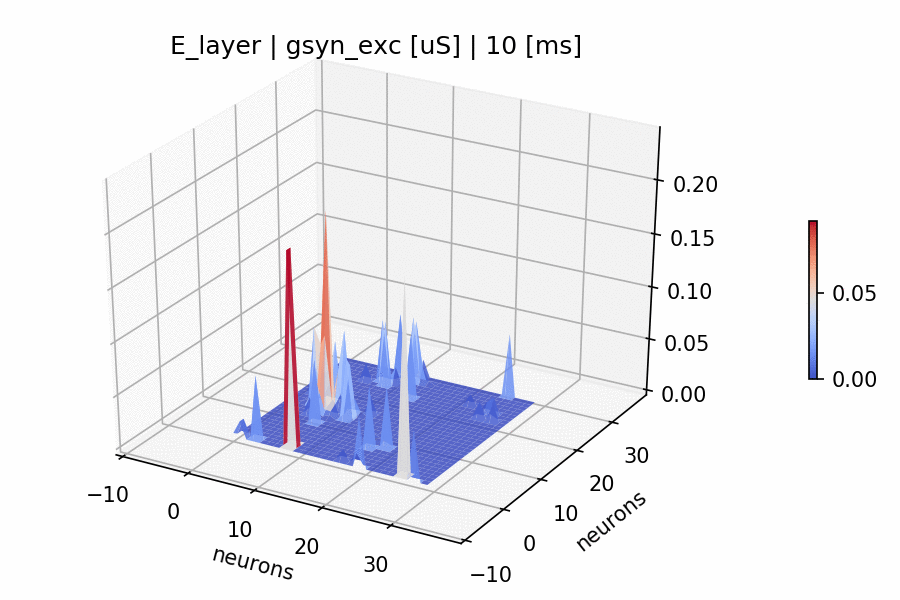

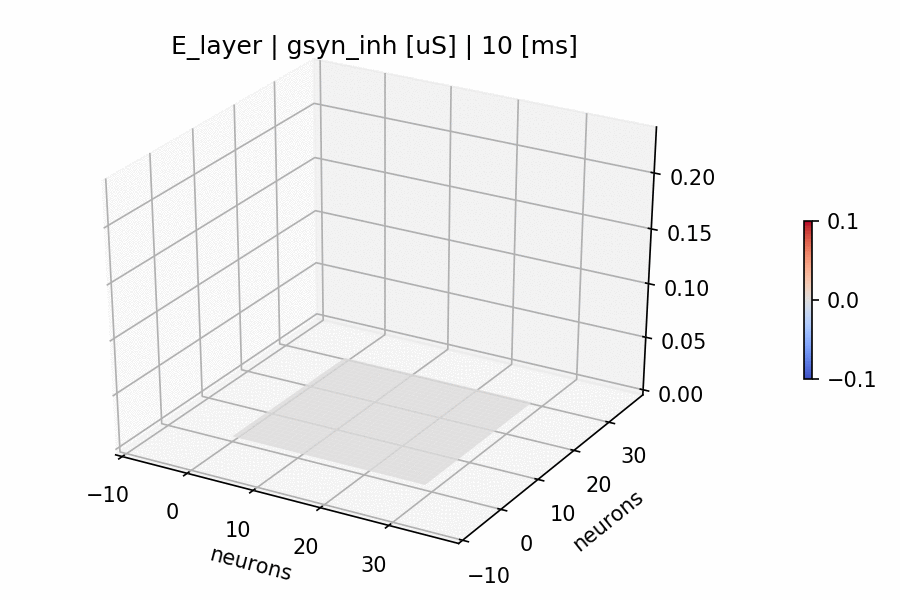

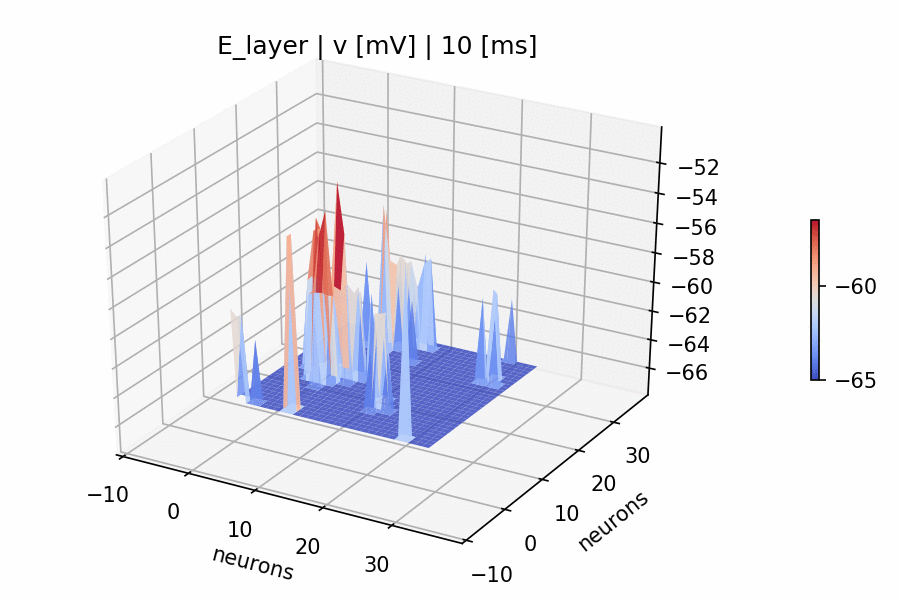

In [24]:
from IPython.display import Image
from IPython.display import display
import matplotlib.image as mpimg

ge = Image(filename='./moving_bump_png/E_layer/gsyn_exc.gif')
gi = Image(filename='./moving_bump_png/E_layer/gsyn_inh.gif')
v = Image(filename='./moving_bump_png/E_layer/v.gif')

display(ge, gi, v)   

# I layer moving dot video representations

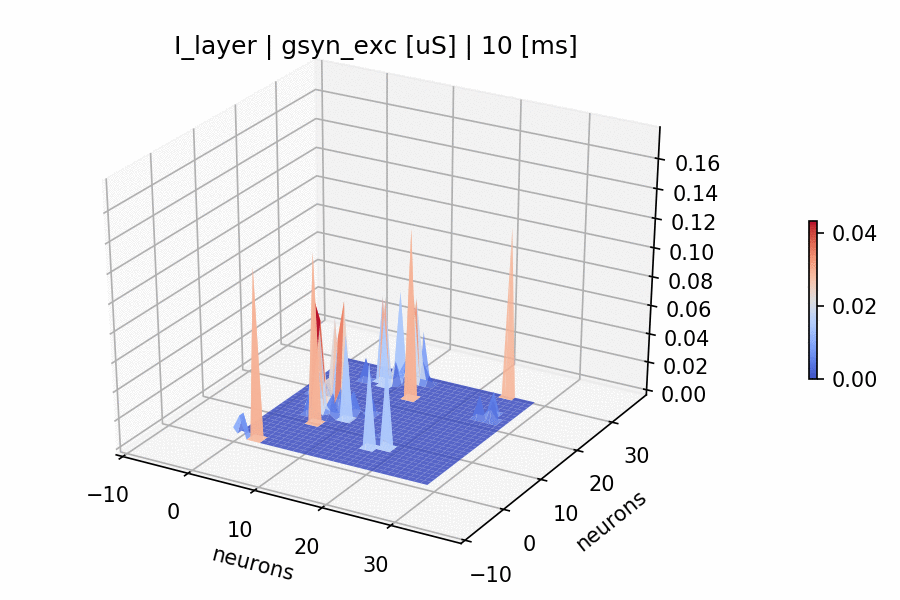

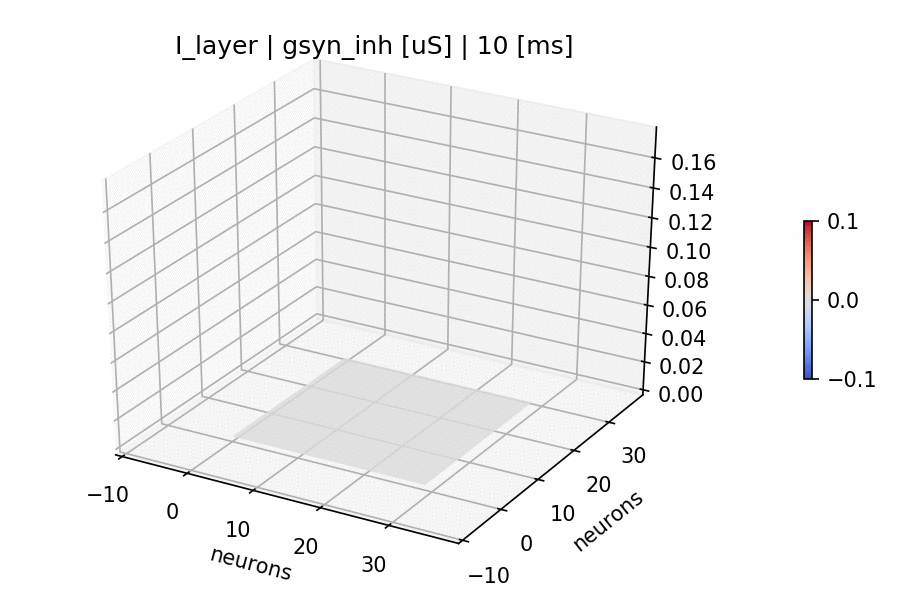

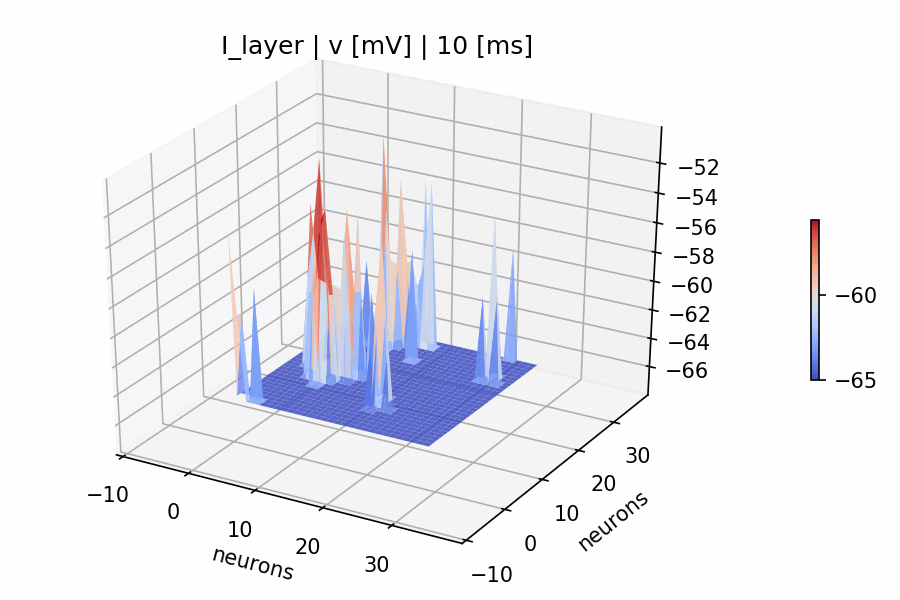

In [25]:
from IPython.display import Image
from IPython.display import display
import matplotlib.image as mpimg

ge = Image(filename='./moving_bump_png/I_layer/gsyn_exc.gif')
gi = Image(filename='./moving_bump_png/I_layer/gsyn_inh.gif')
v = Image(filename='./moving_bump_png/I_layer/v.gif')

display(ge, gi, v)
    
    